In [13]:
import os
import sys
sys.path.append("../virtuosoNet")
sys.path.append("C:\\Users\\fosca\\Desktop\\CNAM\\midi_beat_tracking\\FMP_0.1.0")
import pyScoreParser
from pathlib import Path
import pandas as pd
import music21 as m21
import pretty_midi as pm
from  matplotlib import pyplot as plt
import LibFMP.B
import LibFMP.C2
import LibFMP.C6
%matplotlib inline
import numpy as np
import math
import pandas as pd
import librosa
import soundfile

import IPython.display as ipd

## Produce downbeats and beats

In [2]:
d = {1.332: "b", 4:"bW"}
1.332 not in d

False

In [3]:
def quant_downbeat_to_annotations(midi_quant_path):
    mididata = pm.PrettyMIDI(str(midi_quant_path))
    downbeats = mididata.get_downbeats()
    #the downbeat duration (in theory)
    db_len = downbeats[2]-downbeats[1]
    downbeat = {}
    for i, db in enumerate(downbeats[:-1]):
        assert(db not in downbeat) #check if all values are uniques
        if math.isclose(downbeats[i+1]-downbeats[i], db_len, rel_tol=1e-2):
            downbeat[db] = "db"
        else:
            downbeat[db]= "dbW"
    #sort the dictionary just in case there are weird values
    ord_downbeat = {k: v for k, v in sorted(downbeat.items(), key=lambda item: item[1])}
    return ord_downbeat

def quant_beat_to_annotations(midi_quant_path):
    mididata = pm.PrettyMIDI(str(midi_quant_path))
    beats = mididata.get_beats()
    #the beat duration (in theory)
    b_len = beats[10]-beats[9] #multiple short beats in the beginning sometimes
    beat = {}
    for i, b in enumerate(beats[:-1]):
        assert(b not in beat) #check if all values are uniques
        if math.isclose(beats[i+1]-beats[i], b_len, rel_tol=1e-2):
            beat[b] = "b"
        else:
            beat[b] = "bW"
    #sort the dictionary just in case there are weird values
    ord_beat = {k: v for k, v in sorted(beat.items(), key=lambda item: item[1])}
    return beat

def aggregate_annotations(beat, downbeat):
    #merge the downbeat and the beat, with downbeat overwriting beat informations
    annotations ={**beat, **downbeat}
    return annotations

def beat_downbeat_to_text(annotations,out_path):
    path = Path(out_path)
    #produce the txt
    file_content = ""
    for a in annotations:
        file_content+= str(a) + "\t" + str(a) + "\t" + annotations[a] + "\n"
    with open(out_path,"w") as f:
        f.write(file_content)
        
def annotations_to_audio(midi_quant_path, annotations, out_path):
    midi_data = pm.PrettyMIDI(str(midi_quant_path))
    audio_fs = 22100
    beat = [a for a in annotations if annotations[a][0] == "b"]
    downbeat = [a for a in annotations if annotations[a][0] == "d"]
    midi_audio = midi_data.synthesize(fs=audio_fs)
    audio_beat = librosa.clicks(beat, sr=audio_fs, click_freq=900, length=len(midi_audio))
    audio_downbeat = librosa.clicks(downbeat, sr=audio_fs, click_freq=1200, length=len(midi_audio))
    soundfile.write(out_path,audio_beat + audio_downbeat+ midi_audio,audio_fs)

## produce for the entire dataset
Fields:
- author
- name
- folder
- performance_midi
- score_midi
- score_xml
- score2midi_alignment
- midi2midi_alignment_path
- beats
- downbeats

Dataframe problems:
- Bach/Fugue/bwv_860/midi_cleaned.mid, index: 29, the downbeat is every 3 downbeats
- Scriabin/Etudes_op_8/11/midi_cleaned.mid, index: 938, downbeat is half of the downbeat, beat is not aligned
- Bach/Fugue/bwv_857/Bult-ItoS02.mid, index: 16, beat have problems because matched with wrong note of trillo

In [4]:
def parse_folder_content(folder_path,base_path):
    #take the performance_midi
    assert(Path(base_path,folder_path.relative_to(base_path),"midi_cleaned.mid").exists())
    score_midi_path = Path(folder_path.relative_to(base_path),"midi_cleaned.mid").as_posix()
    #take the score_midi
    assert( Path(base_path,folder_path.relative_to(base_path),"musicxml_cleaned.musicxml").exists())
    score_xml_path = Path(folder_path.relative_to(base_path),"musicxml_cleaned.musicxml").as_posix()
    #find the performances
    performances_name = []
    for file in folder_path.iterdir():
        if file.suffix.lower() == ".mid" and file.name.lower() != "midi_cleaned.mid" and (not file.name.lower().endswith("xp.mid")) and file.name.lower()!="midi.mid":
            performances_name.append(file)
    #iterate over the performances
    performances = []
    for p in performances_name:
        #check if everything exists
        assert(Path(base_path,folder_path.relative_to(base_path),p.name).exists())
        print(Path(base_path,folder_path.relative_to(base_path),p.stem + "_infer_corresp.txt"))
        assert(Path(base_path,folder_path.relative_to(base_path),p.stem + "_infer_corresp.txt").exists())
        assert(Path(base_path,folder_path.relative_to(base_path),p.stem + "_infer_match.txt"))
        performances.append({
            "performer" : p.stem,
            "score_midi_path" : score_midi_path,
            "score_xml_path" : score_xml_path,
            "performed_midi_path": Path(folder_path.relative_to(base_path),p.name).as_posix(),
            "score2midi_alignment" : Path(folder_path.relative_to(base_path),p.stem + "_infer_match.txt").as_posix(),
            "midi2midi_alignment_path" : Path(folder_path.relative_to(base_path),p.stem + "_infer_corresp.txt").as_posix(),
            "folder" : Path(folder_path.relative_to(base_path)).as_posix()
        })
    return performances     

In [5]:
basepath = Path('')
for e in basepath.iterdir(): #loop on the authors
    if e.is_dir() and e.name[0] != ".":
        print(e)

Bach
Balakirev
Beethoven
Brahms
Chopin
Debussy
Glinka
Haydn
Liszt
Mozart
Prokofiev
Rachmaninoff
Ravel
Schubert
Schumann
Scriabin
util


In [6]:
#explore all the subfolders and collect the useful files name

basepath = Path('')
performances = []
for e in basepath.iterdir(): #loop on the authors
    if e.is_dir() and e.name[0] != ".":
        print("Processing", e.name)
        for ee in e.iterdir(): # loop on kind of opus or piece
            assert(ee.is_dir())
            # can be inside a piece folder or list of pieces folders
            if any([eee.is_dir() for eee in ee.iterdir()]): #this contains folder of pieces
                for eee in ee.iterdir():
                    if eee.is_dir():
                        print(e.name, eee.name)
                        print(eee.name,ee.name,e.name)
                        ps = (parse_folder_content(eee,basepath))
                        #add title and author
                        for p in ps:
                            p["title"] = ee.name+"_"+eee.name
                            p["author"] = e.name
                        performances.extend(ps)
            else: 
                ps = (parse_folder_content(ee,basepath))
                #add title and author
                for p in ps:
                    p["title"] = ee.name
                    p["author"] = e.name
                performances.extend(ps)

Processing Bach
Bach bwv_846
bwv_846 Fugue Bach
Bach\Fugue\bwv_846\Shi05_infer_corresp.txt
Bach bwv_848
bwv_848 Fugue Bach
Bach\Fugue\bwv_848\Denisova06_infer_corresp.txt
Bach\Fugue\bwv_848\Lee01_infer_corresp.txt
Bach\Fugue\bwv_848\LeeSH01_infer_corresp.txt
Bach\Fugue\bwv_848\Lin04_infer_corresp.txt
Bach\Fugue\bwv_848\Lou01_infer_corresp.txt
Bach\Fugue\bwv_848\MiyashitaM01_infer_corresp.txt
Bach\Fugue\bwv_848\Mizumoto03_infer_corresp.txt
Bach\Fugue\bwv_848\SunY01_infer_corresp.txt
Bach\Fugue\bwv_848\Zhou01_infer_corresp.txt
Bach bwv_854
bwv_854 Fugue Bach
Bach\Fugue\bwv_854\LuA01_infer_corresp.txt
Bach\Fugue\bwv_854\MiyashitaM01_infer_corresp.txt
Bach\Fugue\bwv_854\Ozaki01_infer_corresp.txt
Bach\Fugue\bwv_854\Richardson01_infer_corresp.txt
Bach\Fugue\bwv_854\WangA01_infer_corresp.txt
Bach bwv_856
bwv_856 Fugue Bach
Bach\Fugue\bwv_856\LuoJ01_infer_corresp.txt
Bach bwv_857
bwv_857 Fugue Bach
Bach\Fugue\bwv_857\Bult-ItoS02_infer_corresp.txt
Bach\Fugue\bwv_857\Lan01_infer_corresp.txt
Bach

Bach\Prelude\bwv_889\Wang01_infer_corresp.txt
Bach\Prelude\bwv_889\YangY02_infer_corresp.txt
Bach\Prelude\bwv_889\ZhangW02_infer_corresp.txt
Bach bwv_891
bwv_891 Prelude Bach
Bach\Prelude\bwv_891\BLINOV04_infer_corresp.txt
Bach\Prelude\bwv_891\Duepree06_infer_corresp.txt
Bach bwv_892
bwv_892 Prelude Bach
Bach\Prelude\bwv_892\Hou01_infer_corresp.txt
Bach\Prelude\bwv_892\KabuliL01_infer_corresp.txt
Bach bwv_893
bwv_893 Prelude Bach
Bach\Prelude\bwv_893\Kleisen04_infer_corresp.txt
Bach\Prelude\bwv_893\Levitsky04_infer_corresp.txt
Bach\Prelude\bwv_893\Wong01_infer_corresp.txt
Processing Balakirev
Balakirev\Islamey\CHEN04_infer_corresp.txt
Balakirev\Islamey\CHEN10_infer_corresp.txt
Balakirev\Islamey\Cho05_infer_corresp.txt
Balakirev\Islamey\Gorucan03_infer_corresp.txt
Balakirev\Islamey\Na04_infer_corresp.txt
Balakirev\Islamey\Na08_infer_corresp.txt
Balakirev\Islamey\Shelest03_infer_corresp.txt
Balakirev\Islamey\Shi11_infer_corresp.txt
Balakirev\Islamey\Verbaite04_infer_corresp.txt
Balakirev

Beethoven\Piano_Sonatas\7-1\KOLESO01_infer_corresp.txt
Beethoven\Piano_Sonatas\7-1\Larionova04_infer_corresp.txt
Beethoven\Piano_Sonatas\7-1\LeeS02_infer_corresp.txt
Beethoven\Piano_Sonatas\7-1\Lee_E01_infer_corresp.txt
Beethoven\Piano_Sonatas\7-1\MATSUM01_infer_corresp.txt
Beethoven\Piano_Sonatas\7-1\Wang02_infer_corresp.txt
Beethoven\Piano_Sonatas\7-1\WangY01_infer_corresp.txt
Beethoven\Piano_Sonatas\7-1\ZhangE02_infer_corresp.txt
Beethoven 7-2
7-2 Piano_Sonatas Beethoven
Beethoven\Piano_Sonatas\7-2\Larionova04_infer_corresp.txt
Beethoven\Piano_Sonatas\7-2\LeeS03_infer_corresp.txt
Beethoven 7-3
7-3 Piano_Sonatas Beethoven
Beethoven\Piano_Sonatas\7-3\Larionova04_infer_corresp.txt
Beethoven\Piano_Sonatas\7-3\LeeS04_infer_corresp.txt
Beethoven 7-4
7-4 Piano_Sonatas Beethoven
Beethoven\Piano_Sonatas\7-4\Larionova04_infer_corresp.txt
Beethoven\Piano_Sonatas\7-4\LeeS05_infer_corresp.txt
Beethoven 8-1
8-1 Piano_Sonatas Beethoven
Beethoven\Piano_Sonatas\8-1\ChenS01_infer_corresp.txt
Beethove

Chopin\Sonata_3\2nd\Shybayeva07_infer_corresp.txt
Chopin 3rd
3rd Sonata_3 Chopin
Chopin\Sonata_3\3rd\GarritsonL10_infer_corresp.txt
Chopin\Sonata_3\3rd\HONG08_infer_corresp.txt
Chopin\Sonata_3\3rd\Huangci06_infer_corresp.txt
Chopin\Sonata_3\3rd\HuangSW05_infer_corresp.txt
Chopin\Sonata_3\3rd\KimSJ09_infer_corresp.txt
Chopin\Sonata_3\3rd\KimSY22_infer_corresp.txt
Chopin\Sonata_3\3rd\mikahailoff01_infer_corresp.txt
Chopin\Sonata_3\3rd\SCHU09_infer_corresp.txt
Chopin\Sonata_3\3rd\Shybayeva07_infer_corresp.txt
Chopin 4th
4th Sonata_3 Chopin
Chopin\Sonata_3\4th\GarritsonL11_infer_corresp.txt
Chopin\Sonata_3\4th\HONG08_infer_corresp.txt
Chopin\Sonata_3\4th\Huangci06_infer_corresp.txt
Chopin\Sonata_3\4th\HuangSW06_infer_corresp.txt
Chopin\Sonata_3\4th\KimSJ10_infer_corresp.txt
Chopin\Sonata_3\4th\KimSY23_infer_corresp.txt
Chopin\Sonata_3\4th\mikahailoff01_infer_corresp.txt
Chopin\Sonata_3\4th\SCHU09_infer_corresp.txt
Chopin\Sonata_3\4th\Shybayeva07_infer_corresp.txt
Processing Debussy
Debussy

Schubert\Impromptu_op142\3\Lin05_infer_corresp.txt
Schubert\Impromptu_op142\3\Richardson07_infer_corresp.txt
Schubert\Impromptu_op142\3\RichardsonC06_infer_corresp.txt
Schubert\Impromptu_op142\3\SunY08_infer_corresp.txt
Schubert\Impromptu_op142\3\Tuncali02_infer_corresp.txt
Schubert\Impromptu_op142\3\WangH06_infer_corresp.txt
Schubert\Impromptu_op142\3\YoungS06_infer_corresp.txt
Schubert\Moment_Musical_no_1\MunA10_infer_corresp.txt
Schubert\Moment_musical_no_3\Tetzloff09_infer_corresp.txt
Schubert 664-1
664-1 Piano_Sonatas Schubert
Schubert\Piano_Sonatas\664-1\BuiJL06_infer_corresp.txt
Schubert\Piano_Sonatas\664-1\KabuliL10_infer_corresp.txt
Schubert\Piano_Sonatas\664-1\Lin07_infer_corresp.txt
Schubert\Piano_Sonatas\664-1\Mo10_infer_corresp.txt
Schubert 664-2
664-2 Piano_Sonatas Schubert
Schubert\Piano_Sonatas\664-2\KabuliL11_infer_corresp.txt
Schubert\Piano_Sonatas\664-2\Lin07_infer_corresp.txt
Schubert 664-3
664-3 Piano_Sonatas Schubert
Schubert\Piano_Sonatas\664-3\KabuliL12_infer_co

AssertionError: 

In [7]:
df = pd.DataFrame(performances)

df.groupby(["author","title"]).count()
df.shape
df

df.to_pickle("performance_dataframe.pkl")

In [10]:
df[df["folder"]=="Liszt/Transcendental_Etudes/11"]

,author,folder,midi2midi_alignment_path,performed_midi_path,performer,score2midi_alignment,score_midi_path,score_xml_path,title
903,Liszt,Liszt/Transcendental_Etudes/11,Liszt/Transcendental_Etudes/11/Huang18_infer_c...,Liszt/Transcendental_Etudes/11/Huang18.MID,Huang18,Liszt/Transcendental_Etudes/11/Huang18_infer_m...,Liszt/Transcendental_Etudes/11/midi_cleaned.mid,Liszt/Transcendental_Etudes/11/musicxml_cleane...,Transcendental_Etudes_11


In [11]:
# create and save as excel for collaboration
df_folder = df.drop_duplicates(subset=["folder"])[["folder"]].reset_index(drop=True).rename(columns={"folder": "opus"})
df_folder["done"] = [False for i in df_folder.iterrows()]
df_folder

# uncomment the following to write the file
# df_folder.to_excel("output.xlsx")

,opus,done
0,Bach/Fugue/bwv_846,False
1,Bach/Fugue/bwv_848,False
2,Bach/Fugue/bwv_854,False
3,Bach/Fugue/bwv_856,False
4,Bach/Fugue/bwv_857,False
5,Bach/Fugue/bwv_858,False
6,Bach/Fugue/bwv_860,False
7,Bach/Fugue/bwv_862,False
8,Bach/Fugue/bwv_863,False
9,Bach/Fugue/bwv_864,False


In [15]:
# create and save the df of scores
df_scores = df.drop_duplicates(subset=["score_xml_path"])[["score_xml_path","folder","author"]].reset_index(drop=True).rename(columns={"folder": "opus"})
df_scores
# df_scores.to_pickle("score_dataframe.pkl")

#create and save the df of quantized things (midi and score)
df_quant = df.drop_duplicates(subset=["score_xml_path"])[["score_xml_path", "score_midi_path","folder","author"]].reset_index(drop=True).rename(columns={"folder": "opus"})
df_quant
# df_scores.to_pickle("quant_dataframe.pkl")


,score_xml_path,score_midi_path,opus,author
0,Bach/Fugue/bwv_846/musicxml_cleaned.musicxml,Bach/Fugue/bwv_846/midi_cleaned.mid,Bach/Fugue/bwv_846,Bach
1,Bach/Fugue/bwv_848/musicxml_cleaned.musicxml,Bach/Fugue/bwv_848/midi_cleaned.mid,Bach/Fugue/bwv_848,Bach
2,Bach/Fugue/bwv_854/musicxml_cleaned.musicxml,Bach/Fugue/bwv_854/midi_cleaned.mid,Bach/Fugue/bwv_854,Bach
3,Bach/Fugue/bwv_856/musicxml_cleaned.musicxml,Bach/Fugue/bwv_856/midi_cleaned.mid,Bach/Fugue/bwv_856,Bach
4,Bach/Fugue/bwv_857/musicxml_cleaned.musicxml,Bach/Fugue/bwv_857/midi_cleaned.mid,Bach/Fugue/bwv_857,Bach
5,Bach/Fugue/bwv_858/musicxml_cleaned.musicxml,Bach/Fugue/bwv_858/midi_cleaned.mid,Bach/Fugue/bwv_858,Bach
6,Bach/Fugue/bwv_860/musicxml_cleaned.musicxml,Bach/Fugue/bwv_860/midi_cleaned.mid,Bach/Fugue/bwv_860,Bach
7,Bach/Fugue/bwv_862/musicxml_cleaned.musicxml,Bach/Fugue/bwv_862/midi_cleaned.mid,Bach/Fugue/bwv_862,Bach
8,Bach/Fugue/bwv_863/musicxml_cleaned.musicxml,Bach/Fugue/bwv_863/midi_cleaned.mid,Bach/Fugue/bwv_863,Bach
9,Bach/Fugue/bwv_864/musicxml_cleaned.musicxml,Bach/Fugue/bwv_864/midi_cleaned.mid,Bach/Fugue/bwv_864,Bach


In [7]:
from collections import Counter
Counter(df["author"]).keys()

dict_keys(['Bach', 'Balakirev', 'Beethoven', 'Brahms', 'Chopin', 'Debussy', 'Glinka', 'Haydn', 'Liszt', 'Mozart', 'Prokofiev', 'Rachmaninoff', 'Ravel', 'Schubert', 'Schumann', 'Scriabin'])

In [31]:
# WRITE FILES IN THE DATASET. Uncomment the last two lines to write them

def row_to_quant_ann(row):
    dbs = quant_downbeat_to_annotations(row["score_midi_path"])
    bs = quant_beat_to_annotations(row["score_midi_path"])
    anns = aggregate_annotations(bs,dbs)
    beat_downbeat_to_text(anns, str(Path(row["folder"],"ann_quant.txt")))
    annotations_to_audio(row["score_midi_path"],anns,str(Path(row["folder"],"quant_click.wav")))

# for i,row in df.drop_duplicates(subset ="score_midi_path", keep = "first", inplace = False).iterrows():
#     row_to_quant_ann(row)

C:\Users\fosca\Anaconda3\envs\music_env\lib\site-packages\pretty_midi\pretty_midi.py:100: RuntimeWarning: Tempo, Key or Time signature change events found on non-zero tracks.  This is not a valid type 0 or type 1 MIDI file.  Tempo, Key or Time Signature may be wrong.
  RuntimeWarning)


In [21]:
df.drop_duplicates(subset=["title"]).groupby("author").count()

,folder,midi2midi_alignment_path,performed_midi_path,performer,score2midi_alignment,score_midi_path,score_xml_path,title
author,,,,,,,,
Bach,59,59,59,59,59,59,59,59
Balakirev,1,1,1,1,1,1,1,1
Beethoven,64,64,64,64,64,64,64,64
Brahms,1,1,1,1,1,1,1,1
Chopin,36,36,36,36,36,36,36,36
Debussy,2,2,2,2,2,2,2,2
Glinka,1,1,1,1,1,1,1,1
Haydn,12,12,12,12,12,12,12,12
Liszt,16,16,16,16,16,16,16,16


## Produce annotations for a single song
when there is something to correct in the generation

In [51]:
#PAVANE, df index 997,998
# the beats and downbeats extracted are not aligned. Maybe it depends on tempo changes, so let's try to remove them

row = df.iloc[998]

score_path = row["score_midi_path"]
score2midi_path = row["midi2midi_alignment_path"]
midi2midi_path = row["score2midi_alignment"]
midi_quant_path = row["score_midi_path"]

#open the midi
tempo_changes = mididata.get_tempo_changes()
print(tempo_changes)
downbeats = mididata.get_downbeats()

midi_data = pm.PrettyMIDI(str(midi_quant_path))
audio_fs = 22100
midi_audio = midi_data.synthesize(fs=audio_fs)[0: 20*audio_fs]
audio_beat = librosa.clicks(midi_data.get_beats(), sr=audio_fs, click_freq=900, length=len(midi_audio))
audio_downbeat = librosa.clicks(midi_data.get_downbeats(), sr=audio_fs, click_freq=1200, length=len(midi_audio))

ipd.display(ipd.Audio(audio_beat + audio_downbeat+ midi_audio,rate =audio_fs))


dbs = quant_downbeat_to_annotations(midi_quant_path)
bs = quant_beat_to_annotations(midi_quant_path)
anns = aggregate_annotations(bs,dbs)
beat_downbeat_to_text(anns, str(Path(row["folder"],"ann_quant.txt")))
annotations_to_audio(row["score_midi_path"],anns,str(Path(row["folder"],"quant_click.wav")))

(array([0.]), array([190.000285]))


C:\Users\fosca\Anaconda3\envs\music_env\lib\site-packages\pretty_midi\pretty_midi.py:100: RuntimeWarning: Tempo, Key or Time signature change events found on non-zero tracks.  This is not a valid type 0 or type 1 MIDI file.  Tempo, Key or Time Signature may be wrong.
  RuntimeWarning)


In [22]:
# Schubert/Impromptu_op.90_D.899/1, df index 999-1002
# the beats and downbeats extracted are aligned with the audio produced by the midi, but not in sync with the midi:/ Let's try to recompile them
row = df.iloc[999]

score_path = row["score_midi_path"]
score2midi_path = row["midi2midi_alignment_path"]
midi2midi_path = row["score2midi_alignment"]
midi_quant_path = row["score_midi_path"]

print("processing score", score_path)

midi_data = pm.PrettyMIDI(str(midi_quant_path))

dbs = quant_downbeat_to_annotations(midi_quant_path)
bs = quant_beat_to_annotations(midi_quant_path)
anns = aggregate_annotations(bs,dbs)
beat_downbeat_to_text(anns, str(Path(row["folder"],"ann_quant.txt")))
annotations_to_audio(row["score_midi_path"],anns,str(Path(row["folder"],"quant_click.wav")))

# PROBLEM NOT SOLVED. VERY WEIRD!!!!!!!!!!!!!!!!!!!!!!!!!!!

processing score Schubert/Impromptu_op.90_D.899/1/midi_cleaned.mid


C:\Users\fosca\Anaconda3\envs\music_env\lib\site-packages\pretty_midi\pretty_midi.py:100: RuntimeWarning: Tempo, Key or Time signature change events found on non-zero tracks.  This is not a valid type 0 or type 1 MIDI file.  Tempo, Key or Time Signature may be wrong.
  RuntimeWarning)


In [20]:
# Schubert/Piano_Sonatas/664-3, df index 1049,1050
# the beats and downbeats extracted are in 4/4. I re exported the midi in 6/8 (correct ts) and now we need the beat again

row = df.iloc[1049]

score_path = row["score_midi_path"]
score2midi_path = row["midi2midi_alignment_path"]
midi2midi_path = row["score2midi_alignment"]
midi_quant_path = row["score_midi_path"]

print("processing score", score_path)

midi_data = pm.PrettyMIDI(str(midi_quant_path))

#open the midi
tempo_changes = midi_data.get_tempo_changes()
print(tempo_changes)
downbeats = midi_data.get_downbeats()


audio_fs = 22100
midi_audio = midi_data.synthesize(fs=audio_fs)[0: 20*audio_fs]
audio_beat = librosa.clicks(midi_data.get_beats(), sr=audio_fs, click_freq=900, length=len(midi_audio))
audio_downbeat = librosa.clicks(midi_data.get_downbeats(), sr=audio_fs, click_freq=1200, length=len(midi_audio))

ipd.display(ipd.Audio(audio_beat + audio_downbeat+ midi_audio,rate =audio_fs))


dbs = quant_downbeat_to_annotations(midi_quant_path)
bs = quant_beat_to_annotations(midi_quant_path)
anns = aggregate_annotations(bs,dbs)


#correct the 6/8 bug adding db annotations
for i,k in enumerate(anns.keys()):
    if i%2 == 1 and anns[k] == "b":
        anns[k] = "db"
        
print(anns)


beat_downbeat_to_text(anns, str(Path(row["folder"],"ann_quant.txt")))
annotations_to_audio(row["score_midi_path"],anns,str(Path(row["folder"],"quant_click.wav")))


processing score Schubert/Piano_Sonatas/664-3/midi_cleaned.mid
(array([0.]), array([85.0000425]))


C:\Users\fosca\Anaconda3\envs\music_env\lib\site-packages\pretty_midi\pretty_midi.py:100: RuntimeWarning: Tempo, Key or Time signature change events found on non-zero tracks.  This is not a valid type 0 or type 1 MIDI file.  Tempo, Key or Time Signature may be wrong.
  RuntimeWarning)


{0.0: 'dbW', 0.352941: 'bW', 0.705882: 'bW', 1.0588229999999998: 'db', 2.1176459999999997: 'b', 3.176469: 'db', 4.235292: 'b', 5.294115000000001: 'db', 6.352938000000001: 'b', 7.411761000000001: 'db', 8.470584: 'b', 9.529407: 'db', 10.588230000000001: 'b', 11.647053000000001: 'db', 12.705876000000002: 'b', 13.764699000000002: 'db', 14.823522000000002: 'b', 15.882345000000003: 'db', 16.941168: 'b', 17.999991: 'db', 19.058814: 'b', 20.117637000000002: 'db', 21.176460000000002: 'b', 22.235283000000003: 'db', 23.294106000000003: 'b', 24.352929000000003: 'db', 25.411752000000003: 'b', 26.470575000000004: 'db', 27.529398000000004: 'b', 28.588221000000004: 'db', 29.647044000000005: 'b', 30.705867000000005: 'db', 31.764690000000005: 'b', 32.823513000000005: 'db', 33.882336: 'b', 34.941159: 'db', 35.999981999999996: 'b', 37.05880499999999: 'db', 38.11762799999999: 'b', 39.176450999999986: 'db', 40.23527399999998: 'b', 41.29409699999998: 'db', 42.352919999999976: 'b', 43.41174299999997: 'db', 44

In [9]:
# Bach/Fugue/bwv_867, df index 39,40
# there was no time signature and there were only db in the automatic extraction. Corrected the ts, now we compute the annot again

row = df.iloc[39]

score_path = row["score_midi_path"]
score2midi_path = row["midi2midi_alignment_path"]
midi2midi_path = row["score2midi_alignment"]
midi_quant_path = row["score_midi_path"]

print("processing score", score_path)

midi_data = pm.PrettyMIDI(str(midi_quant_path))

#open the midi
tempo_changes = midi_data.get_tempo_changes()
print(tempo_changes)
downbeats = midi_data.get_downbeats()


audio_fs = 22100
midi_audio = midi_data.synthesize(fs=audio_fs)[0: 20*audio_fs]
audio_beat = librosa.clicks(midi_data.get_beats(), sr=audio_fs, click_freq=900, length=len(midi_audio))
audio_downbeat = librosa.clicks(midi_data.get_downbeats(), sr=audio_fs, click_freq=1200, length=len(midi_audio))

ipd.display(ipd.Audio(audio_beat + audio_downbeat+ midi_audio,rate =audio_fs))


dbs = quant_downbeat_to_annotations(midi_quant_path)
bs = quant_beat_to_annotations(midi_quant_path)
anns = aggregate_annotations(bs,dbs)



beat_downbeat_to_text(anns, str(Path(row["folder"],"ann_quant.txt")))
annotations_to_audio(row["score_midi_path"],anns,str(Path(row["folder"],"quant_click.wav")))


processing score Bach/Fugue/bwv_867/midi_cleaned.mid
(array([0.]), array([120.]))


C:\Users\fosca\Anaconda3\envs\music_env\lib\site-packages\pretty_midi\pretty_midi.py:100: RuntimeWarning: Tempo, Key or Time signature change events found on non-zero tracks.  This is not a valid type 0 or type 1 MIDI file.  Tempo, Key or Time Signature may be wrong.
  RuntimeWarning)


In [28]:
# Bach/Fugue/bwv_873, df index 45,46
# time signature of 12/16 had a beat every 6 16th notes. We want them to be every 3 16th notes

row = df.iloc[45]

score_path = row["score_midi_path"]
score2midi_path = row["midi2midi_alignment_path"]
midi2midi_path = row["score2midi_alignment"]
midi_quant_path = row["score_midi_path"]

print("processing score", score_path)

midi_data = pm.PrettyMIDI(str(midi_quant_path))

#open the midi
tempo_changes = midi_data.get_tempo_changes()
print(tempo_changes)
downbeats = midi_data.get_downbeats()


audio_fs = 22100
midi_audio = midi_data.synthesize(fs=audio_fs)[0: 20*audio_fs]
audio_beat = librosa.clicks(midi_data.get_beats(), sr=audio_fs, click_freq=900, length=len(midi_audio))
audio_downbeat = librosa.clicks(midi_data.get_downbeats(), sr=audio_fs, click_freq=1200, length=len(midi_audio))

ipd.display(ipd.Audio(audio_beat + audio_downbeat+ midi_audio,rate =audio_fs))


dbs = quant_downbeat_to_annotations(midi_quant_path)
bs = quant_beat_to_annotations(midi_quant_path)
anns = aggregate_annotations(bs,dbs)

ann_time = sorted(list(anns.keys()))
#add the missing beats every beat
#compute the beat lenght
b_len = ann_time[3]-ann_time[2]
assert(ann_time[17]-ann_time[16])
for i,k in enumerate(ann_time):
    print(k, end=", ")
    anns[k+b_len/2] = "b"

print("_____________")
ann_time = sorted(list(anns.keys()))
#add the missing downbeats every beat
for i,k in enumerate(ann_time):
    print(k, end=", ")
    if (i%4 == 0):
        anns[k] = "db"


beat_downbeat_to_text(anns, str(Path(row["folder"],"ann_quant.txt")))
annotations_to_audio(row["score_midi_path"],anns,str(Path(row["folder"],"quant_click.wav")))

processing score Bach/Fugue/bwv_873/midi_cleaned.mid
(array([0.]), array([120.]))


C:\Users\fosca\Anaconda3\envs\music_env\lib\site-packages\pretty_midi\pretty_midi.py:100: RuntimeWarning: Tempo, Key or Time signature change events found on non-zero tracks.  This is not a valid type 0 or type 1 MIDI file.  Tempo, Key or Time Signature may be wrong.
  RuntimeWarning)


0.0, 0.75, 1.5, 2.25, 3.0, 3.75, 4.5, 5.25, 6.0, 6.75, 7.5, 8.25, 9.0, 9.75, 10.5, 11.25, 12.0, 12.75, 13.5, 14.25, 15.0, 15.75, 16.5, 17.25, 18.0, 18.75, 19.5, 20.25, 21.0, 21.75, 22.5, 23.25, 24.0, 24.75, 25.5, 26.25, 27.0, 27.75, 28.5, 29.25, 30.0, 30.75, 31.5, 32.25, 33.0, 33.75, 34.5, 35.25, 36.0, 36.75, 37.5, 38.25, 39.0, 39.75, 40.5, 41.25, 42.0, 42.75, 43.5, 44.25, 45.0, 45.75, 46.5, 47.25, 48.0, 48.75, 49.5, 50.25, 51.0, 51.75, 52.5, 53.25, 54.0, 54.75, 55.5, 56.25, 57.0, 57.75, 58.5, 59.25, 60.0, 60.75, 61.5, 62.25, 63.0, 63.75, 64.5, 65.25, 66.0, 66.75, 67.5, 68.25, 69.0, 69.75, 70.5, 71.25, 72.0, 72.75, 73.5, 74.25, 75.0, 75.75, 76.5, 77.25, 78.0, 78.75, 79.5, 80.25, 81.0, 81.75, 82.5, 83.25, 84.0, 84.75, 85.5, 86.25, 87.0, 87.75, 88.5, 89.25, 90.0, 90.75, 91.5, 92.25, 93.0, 93.75, 94.5, 95.25, 96.0, 96.75, 97.5, 98.25, 99.0, 99.75, 100.5, 101.25, 102.0, 102.75, 103.5, 104.25, _____________
0.0, 0.375, 0.75, 1.125, 1.5, 1.875, 2.25, 2.625, 3.0, 3.375, 3.75, 4.125, 4.5, 4.87

In [30]:
# Bach/Fugue/bwv_880, df index 54-56
# time signature of 6/16 had a beat every 6 16th notes (= only dbs). We want them to be every 3 16th notes

row = df.iloc[54]

score_path = row["score_midi_path"]
score2midi_path = row["midi2midi_alignment_path"]
midi2midi_path = row["score2midi_alignment"]
midi_quant_path = row["score_midi_path"]

print("processing score", score_path)

midi_data = pm.PrettyMIDI(str(midi_quant_path))

#open the midi
tempo_changes = midi_data.get_tempo_changes()
print(tempo_changes)
downbeats = midi_data.get_downbeats()


audio_fs = 22100
midi_audio = midi_data.synthesize(fs=audio_fs)[0: 20*audio_fs]
audio_beat = librosa.clicks(midi_data.get_beats(), sr=audio_fs, click_freq=900, length=len(midi_audio))
audio_downbeat = librosa.clicks(midi_data.get_downbeats(), sr=audio_fs, click_freq=1200, length=len(midi_audio))

ipd.display(ipd.Audio(audio_beat + audio_downbeat+ midi_audio,rate =audio_fs))


dbs = quant_downbeat_to_annotations(midi_quant_path)
bs = quant_beat_to_annotations(midi_quant_path)
anns = aggregate_annotations(bs,dbs)

ann_time = sorted(list(anns.keys()))
#add the missing beats every beat
#compute the beat lenght
b_len = ann_time[3]-ann_time[2]
assert(ann_time[17]-ann_time[16])
for i,k in enumerate(ann_time):
    print(k, end=", ")
    anns[k+b_len/2] = "b"

print("_____________")
ann_time = sorted(list(anns.keys()))
#add the missing downbeats every beat
for i,k in enumerate(ann_time):
    print(k, end=", ")
    if (i%2 == 0):
        anns[k] = "db"


beat_downbeat_to_text(anns, str(Path(row["folder"],"ann_quant.txt")))
annotations_to_audio(row["score_midi_path"],anns,str(Path(row["folder"],"quant_click.wav")))

processing score Bach/Fugue/bwv_880/midi_cleaned.mid
(array([0.]), array([120.]))


C:\Users\fosca\Anaconda3\envs\music_env\lib\site-packages\pretty_midi\pretty_midi.py:100: RuntimeWarning: Tempo, Key or Time signature change events found on non-zero tracks.  This is not a valid type 0 or type 1 MIDI file.  Tempo, Key or Time Signature may be wrong.
  RuntimeWarning)


0.0, 0.75, 1.5, 2.25, 3.0, 3.75, 4.5, 5.25, 6.0, 6.75, 7.5, 8.25, 9.0, 9.75, 10.5, 11.25, 12.0, 12.75, 13.5, 14.25, 15.0, 15.75, 16.5, 17.25, 18.0, 18.75, 19.5, 20.25, 21.0, 21.75, 22.5, 23.25, 24.0, 24.75, 25.5, 26.25, 27.0, 27.75, 28.5, 29.25, 30.0, 30.75, 31.5, 32.25, 33.0, 33.75, 34.5, 35.25, 36.0, 36.75, 37.5, 38.25, 39.0, 39.75, 40.5, 41.25, 42.0, 42.75, 43.5, 44.25, 45.0, 45.75, 46.5, 47.25, 48.0, 48.75, 49.5, 50.25, 51.0, 51.75, 52.5, 53.25, 54.0, 54.75, 55.5, 56.25, 57.0, 57.75, 58.5, 59.25, 60.0, 60.75, 61.5, 62.25, 63.0, 63.75, 64.5, 65.25, 66.0, 66.75, 67.5, 68.25, 69.0, 69.75, 70.5, 71.25, 72.0, 72.75, 73.5, _____________
0.0, 0.375, 0.75, 1.125, 1.5, 1.875, 2.25, 2.625, 3.0, 3.375, 3.75, 4.125, 4.5, 4.875, 5.25, 5.625, 6.0, 6.375, 6.75, 7.125, 7.5, 7.875, 8.25, 8.625, 9.0, 9.375, 9.75, 10.125, 10.5, 10.875, 11.25, 11.625, 12.0, 12.375, 12.75, 13.125, 13.5, 13.875, 14.25, 14.625, 15.0, 15.375, 15.75, 16.125, 16.5, 16.875, 17.25, 17.625, 18.0, 18.375, 18.75, 19.125, 19.5, 1

In [32]:
# Chopin/Ballade/3, df index 485-487
# time signature 6/8 have too few dbs
row = df.iloc[485]

score_path = row["score_midi_path"]
score2midi_path = row["midi2midi_alignment_path"]
midi2midi_path = row["score2midi_alignment"]
midi_quant_path = row["score_midi_path"]

print("processing score", score_path)

midi_data = pm.PrettyMIDI(str(midi_quant_path))

#open the midi
tempo_changes = midi_data.get_tempo_changes()
print(tempo_changes)
downbeats = midi_data.get_downbeats()


audio_fs = 22100
midi_audio = midi_data.synthesize(fs=audio_fs)[0: 20*audio_fs]
audio_beat = librosa.clicks(midi_data.get_beats(), sr=audio_fs, click_freq=900, length=len(midi_audio))
audio_downbeat = librosa.clicks(midi_data.get_downbeats(), sr=audio_fs, click_freq=1200, length=len(midi_audio))

ipd.display(ipd.Audio(audio_beat + audio_downbeat+ midi_audio,rate =audio_fs))


dbs = quant_downbeat_to_annotations(midi_quant_path)
bs = quant_beat_to_annotations(midi_quant_path)
anns = aggregate_annotations(bs,dbs)


ann_time = sorted(list(anns.keys()))
#add the missing downbeats every beat
for i,k in enumerate(ann_time):
    print(k, end=", ")
    if (i%2 == 0):
        anns[k] = "db"


beat_downbeat_to_text(anns, str(Path(row["folder"],"ann_quant.txt")))
annotations_to_audio(row["score_midi_path"],anns,str(Path(row["folder"],"quant_click.wav")))

processing score Chopin/Ballades/3/midi_cleaned.mid
(array([0.]), array([120.]))


C:\Users\fosca\Anaconda3\envs\music_env\lib\site-packages\pretty_midi\pretty_midi.py:100: RuntimeWarning: Tempo, Key or Time signature change events found on non-zero tracks.  This is not a valid type 0 or type 1 MIDI file.  Tempo, Key or Time Signature may be wrong.
  RuntimeWarning)


0.0, 0.75, 1.5, 2.25, 3.0, 3.75, 4.5, 5.25, 6.0, 6.75, 7.5, 8.25, 9.0, 9.75, 10.5, 11.25, 12.0, 12.75, 13.5, 14.25, 15.0, 15.75, 16.5, 17.25, 18.0, 18.75, 19.5, 20.25, 21.0, 21.75, 22.5, 23.25, 24.0, 24.75, 25.5, 26.25, 27.0, 27.75, 28.5, 29.25, 30.0, 30.75, 31.5, 32.25, 33.0, 33.75, 34.5, 35.25, 36.0, 36.75, 37.5, 38.25, 39.0, 39.75, 40.5, 41.25, 42.0, 42.75, 43.5, 44.25, 45.0, 45.75, 46.5, 47.25, 48.0, 48.75, 49.5, 50.25, 51.0, 51.75, 52.5, 53.25, 54.0, 54.75, 55.5, 56.25, 57.0, 57.75, 58.5, 59.25, 60.0, 60.75, 61.5, 62.25, 63.0, 63.75, 64.5, 65.25, 66.0, 66.75, 67.5, 68.25, 69.0, 69.75, 70.5, 71.25, 72.0, 72.75, 73.5, 74.25, 75.0, 75.75, 76.5, 77.25, 78.0, 78.75, 79.5, 80.25, 81.0, 81.75, 82.5, 83.25, 84.0, 84.75, 85.5, 86.25, 87.0, 87.75, 88.5, 89.25, 90.0, 90.75, 91.5, 92.25, 93.0, 93.75, 94.5, 95.25, 96.0, 96.75, 97.5, 98.25, 99.0, 99.75, 100.5, 101.25, 102.0, 102.75, 103.5, 104.25, 105.0, 105.75, 106.5, 107.25, 108.0, 108.75, 109.5, 110.25, 111.0, 111.75, 112.5, 113.25, 114.0, 1

In [36]:
# Chopin/Ballade/3, df index 488-4899
# time signature 6/8 have too few dbs
row = df.iloc[488]

score_path = row["score_midi_path"]
score2midi_path = row["midi2midi_alignment_path"]
midi2midi_path = row["score2midi_alignment"]
midi_quant_path = row["score_midi_path"]

print("processing score", score_path)

midi_data = pm.PrettyMIDI(str(midi_quant_path))

#open the midi
tempo_changes = midi_data.get_tempo_changes()
print(tempo_changes)
downbeats = midi_data.get_downbeats()


audio_fs = 22100
midi_audio = midi_data.synthesize(fs=audio_fs)[0: 20*audio_fs]
audio_beat = librosa.clicks(midi_data.get_beats(), sr=audio_fs, click_freq=900, length=len(midi_audio))
audio_downbeat = librosa.clicks(midi_data.get_downbeats(), sr=audio_fs, click_freq=1200, length=len(midi_audio))

ipd.display(ipd.Audio(audio_beat + audio_downbeat+ midi_audio,rate =audio_fs))


dbs = quant_downbeat_to_annotations(midi_quant_path)
bs = quant_beat_to_annotations(midi_quant_path)
anns = aggregate_annotations(bs,dbs)

ann_time = sorted(list(anns.keys()))
#check if there are extra bits
for i,a in enumerate(ann_time):
    if i%6 == 0:
        if anns[a] == "db" or anns[a] == "dbW":
            pass
        else:
            print("Failed for", a)



#add the missing downbeats every beat and remove the warnings
for i,k in enumerate(ann_time):
    print(k, end=", ")
    if (i%2 == 0):
        anns[k] = "db"
    else:
        anns[k] = "b"


beat_downbeat_to_text(anns, str(Path(row["folder"],"ann_quant.txt")))
annotations_to_audio(row["score_midi_path"],anns,str(Path(row["folder"],"quant_click.wav")))

processing score Chopin/Ballades/4/midi_cleaned.mid
(array([  0.        ,  30.75      , 211.375     , 350.125     ,
       362.0567975 , 469.3295355 , 472.4874235 , 487.4874295 ,
       502.9159495 , 514.70166025, 517.66218025, 619.66218025,
       863.41218025]), array([40.        , 48.        , 24.        , 88.00015253, 65.9999934 ,
       76.00016213, 83.9999664 , 70.00023333, 42.0000126 , 76.00016213,
       60.        , 24.        , 72.0000288 ]))


C:\Users\fosca\Anaconda3\envs\music_env\lib\site-packages\pretty_midi\pretty_midi.py:100: RuntimeWarning: Tempo, Key or Time signature change events found on non-zero tracks.  This is not a valid type 0 or type 1 MIDI file.  Tempo, Key or Time Signature may be wrong.
  RuntimeWarning)


Failed for 954.6621437499949
0.0, 2.25, 4.5, 6.75, 9.0, 11.25, 13.5, 15.75, 18.0, 20.25, 22.5, 24.75, 27.0, 29.25, 31.375, 33.25, 35.125, 37.0, 38.875, 40.75, 42.625, 44.5, 46.375, 48.25, 50.125, 52.0, 53.875, 55.75, 57.625, 59.5, 61.375, 63.25, 65.125, 67.0, 68.875, 70.75, 72.625, 74.5, 76.375, 78.25, 80.125, 82.0, 83.875, 85.75, 87.625, 89.5, 91.375, 93.25, 95.125, 97.0, 98.875, 100.75, 102.625, 104.5, 106.375, 108.25, 110.125, 112.0, 113.875, 115.75, 117.625, 119.5, 121.375, 123.25, 125.125, 127.0, 128.875, 130.75, 132.625, 134.5, 136.375, 138.25, 140.125, 142.0, 143.875, 145.75, 147.625, 149.5, 151.375, 153.25, 155.125, 157.0, 158.875, 160.75, 162.625, 164.5, 166.375, 168.25, 170.125, 172.0, 173.875, 175.75, 177.625, 179.5, 181.375, 183.25, 185.125, 187.0, 188.875, 190.75, 192.625, 194.5, 196.375, 198.25, 200.125, 202.0, 203.875, 205.75, 207.625, 209.5, 211.375, 215.125, 218.875, 222.625, 226.375, 230.125, 233.875, 237.625, 241.375, 245.125, 248.875, 252.625, 256.375, 260.125, 263.

In [11]:
# Schumann/Kreisleriana/4, df index 1074,1075
# time signature was wrongly 2/2. Corrected to 4/4 and now have to add the beats
row = df.iloc[1074]

score_path = row["score_midi_path"]
score2midi_path = row["midi2midi_alignment_path"]
midi2midi_path = row["score2midi_alignment"]
midi_quant_path = row["score_midi_path"]

print("processing score", score_path)

midi_data = pm.PrettyMIDI(str(midi_quant_path))

#open the midi
tempo_changes = midi_data.get_tempo_changes()
print(tempo_changes)
downbeats = midi_data.get_downbeats()


audio_fs = 22100
midi_audio = midi_data.synthesize(fs=audio_fs)[0: 20*audio_fs]
audio_beat = librosa.clicks(midi_data.get_beats(), sr=audio_fs, click_freq=900, length=len(midi_audio))
audio_downbeat = librosa.clicks(midi_data.get_downbeats(), sr=audio_fs, click_freq=1200, length=len(midi_audio))

ipd.display(ipd.Audio(audio_beat + audio_downbeat+ midi_audio,rate =audio_fs))


dbs = quant_downbeat_to_annotations(midi_quant_path)
bs = quant_beat_to_annotations(midi_quant_path)
anns = aggregate_annotations(bs,dbs)


beat_downbeat_to_text(anns, str(Path(row["folder"],"ann_quant.txt")))
annotations_to_audio(row["score_midi_path"],anns,str(Path(row["folder"],"quant_click.wav")))

processing score Schumann/Kreisleriana/4/midi_cleaned.mid
(array([0.]), array([32.9999967]))


C:\Users\fosca\Anaconda3\envs\music_env\lib\site-packages\pretty_midi\pretty_midi.py:100: RuntimeWarning: Tempo, Key or Time signature change events found on non-zero tracks.  This is not a valid type 0 or type 1 MIDI file.  Tempo, Key or Time Signature may be wrong.
  RuntimeWarning)


In [13]:
# Scriabin/Etudes_op_8/11, df index 1091-1093
# beats are compiled like if it was 4/4 but the ts is 3/4. Let's try to recompile
row = df.iloc[1091]

score_path = row["score_midi_path"]
score2midi_path = row["midi2midi_alignment_path"]
midi2midi_path = row["score2midi_alignment"]
midi_quant_path = row["score_midi_path"]

print("processing score", score_path)

midi_data = pm.PrettyMIDI(str(midi_quant_path))

#open the midi
tempo_changes = midi_data.get_tempo_changes()
print(tempo_changes)
downbeats = midi_data.get_downbeats()


audio_fs = 22100
midi_audio = midi_data.synthesize(fs=audio_fs)[0: 20*audio_fs]
audio_beat = librosa.clicks(midi_data.get_beats(), sr=audio_fs, click_freq=900, length=len(midi_audio))
audio_downbeat = librosa.clicks(midi_data.get_downbeats(), sr=audio_fs, click_freq=1200, length=len(midi_audio))

ipd.display(ipd.Audio(audio_beat + audio_downbeat+ midi_audio,rate =audio_fs))


dbs = quant_downbeat_to_annotations(midi_quant_path)
bs = quant_beat_to_annotations(midi_quant_path)
anns = aggregate_annotations(bs,dbs)


beat_downbeat_to_text(anns, str(Path(row["folder"],"ann_quant.txt")))
annotations_to_audio(row["score_midi_path"],anns,str(Path(row["folder"],"quant_click.wav")))

# it worked!

processing score Scriabin/Etudes_op_8/11/midi_cleaned.mid
(array([0.]), array([45.00001125]))


C:\Users\fosca\Anaconda3\envs\music_env\lib\site-packages\pretty_midi\pretty_midi.py:100: RuntimeWarning: Tempo, Key or Time signature change events found on non-zero tracks.  This is not a valid type 0 or type 1 MIDI file.  Tempo, Key or Time Signature may be wrong.
  RuntimeWarning)


In [17]:
# Beethoven/Piano_Sonatas/31-1, df index 376-396
# beats are unaligned. Let's try to recompile
row = df.iloc[376]

score_path = row["score_midi_path"]
score2midi_path = row["midi2midi_alignment_path"]
midi2midi_path = row["score2midi_alignment"]
midi_quant_path = row["score_midi_path"]

print("processing score", score_path)

midi_data = pm.PrettyMIDI(str(midi_quant_path))

#open the midi
tempo_changes = midi_data.get_tempo_changes()
print(tempo_changes)
downbeats = midi_data.get_downbeats()


audio_fs = 22100
midi_audio = midi_data.synthesize(fs=audio_fs)[0: 20*audio_fs]
audio_beat = librosa.clicks(midi_data.get_beats(), sr=audio_fs, click_freq=900, length=len(midi_audio))
audio_downbeat = librosa.clicks(midi_data.get_downbeats(), sr=audio_fs, click_freq=1200, length=len(midi_audio))

ipd.display(ipd.Audio(audio_beat + audio_downbeat+ midi_audio,rate =audio_fs))


dbs = quant_downbeat_to_annotations(midi_quant_path)
bs = quant_beat_to_annotations(midi_quant_path)
anns = aggregate_annotations(bs,dbs)


beat_downbeat_to_text(anns, str(Path(row["folder"],"ann_quant.txt")))
annotations_to_audio(row["score_midi_path"],anns,str(Path(row["folder"],"quant_click.wav")))

# it worked!

processing score Beethoven/Piano_Sonatas/31-1/midi_cleaned.mid
(array([  0.        , 241.16384937, 242.27496037]), array([57.99998647, 54.0000054 , 57.99998647]))


C:\Users\fosca\Anaconda3\envs\music_env\lib\site-packages\pretty_midi\pretty_midi.py:100: RuntimeWarning: Tempo, Key or Time signature change events found on non-zero tracks.  This is not a valid type 0 or type 1 MIDI file.  Tempo, Key or Time Signature may be wrong.
  RuntimeWarning)


In [15]:
# Beethoven/Piano_Sonatas/32-1, df index 415-423
# beats are unaligned. Let's try to recompile
row = df.iloc[415]

score_path = row["score_midi_path"]
score2midi_path = row["midi2midi_alignment_path"]
midi2midi_path = row["score2midi_alignment"]
midi_quant_path = row["score_midi_path"]

print("processing score", score_path)

midi_data = pm.PrettyMIDI(str(midi_quant_path))

#open the midi
tempo_changes = midi_data.get_tempo_changes()
print(tempo_changes)
downbeats = midi_data.get_downbeats()


audio_fs = 22100
midi_audio = midi_data.synthesize(fs=audio_fs)[0: 20*audio_fs]
audio_beat = librosa.clicks(midi_data.get_beats(), sr=audio_fs, click_freq=900, length=len(midi_audio))
audio_downbeat = librosa.clicks(midi_data.get_downbeats(), sr=audio_fs, click_freq=1200, length=len(midi_audio))

ipd.display(ipd.Audio(audio_beat + audio_downbeat+ midi_audio,rate =audio_fs))


dbs = quant_downbeat_to_annotations(midi_quant_path)
bs = quant_beat_to_annotations(midi_quant_path)
anns = aggregate_annotations(bs,dbs)


beat_downbeat_to_text(anns, str(Path(row["folder"],"ann_quant.txt")))
annotations_to_audio(row["score_midi_path"],anns,str(Path(row["folder"],"quant_click.wav")))

# it worked!

processing score Beethoven/Piano_Sonatas/32-1/midi_cleaned.mid
(array([  0.        , 108.54168837, 119.22349587, 121.13027712,
       133.97117337, 136.00507337, 140.32325087, 142.86562587,
       173.77468587, 174.86559587, 175.42115187, 175.84171287,
       176.32742752, 176.84665822, 176.99228922, 177.79016047,
       179.09451047, 179.61175173, 183.70266048, 216.42990048,
       218.33668173, 231.17757798, 233.21147798, 237.52965547,
       240.07203047, 270.98109047, 272.07200047, 272.62755648,
       273.04811748, 273.53383213, 274.05306282, 274.19869382,
       274.99656507, 276.30091507, 276.81815632, 280.90906507,
       350.36922289, 350.83433889, 351.31433889, 352.05204339,
       352.30414439, 352.82588339, 353.62945439, 354.17991339,
       360.77081589, 361.87173389, 395.50806389, 397.6055212 ,
       398.4388552 , 398.7245697 , 399.3186287 , 402.25676495,
       406.62040095, 414.4613022 , 415.9013022 , 416.1939852 ,
       416.6402664 , 416.8945039 , 417.2075473 , 417.6

C:\Users\fosca\Anaconda3\envs\music_env\lib\site-packages\pretty_midi\pretty_midi.py:100: RuntimeWarning: Tempo, Key or Time signature change events found on non-zero tracks.  This is not a valid type 0 or type 1 MIDI file.  Tempo, Key or Time Signature may be wrong.
  RuntimeWarning)


In [19]:
# Beethoven/Piano_Sonatas/24-1, df index 309-313
# beats are unaligned. Let's try to recompile
row = df.iloc[309]

score_path = row["score_midi_path"]
score2midi_path = row["midi2midi_alignment_path"]
midi2midi_path = row["score2midi_alignment"]
midi_quant_path = row["score_midi_path"]

print("processing score", score_path)

midi_data = pm.PrettyMIDI(str(midi_quant_path))

#open the midi
tempo_changes = midi_data.get_tempo_changes()
print(tempo_changes)
downbeats = midi_data.get_downbeats()


audio_fs = 22100
midi_audio = midi_data.synthesize(fs=audio_fs)[0: 20*audio_fs]
audio_beat = librosa.clicks(midi_data.get_beats(), sr=audio_fs, click_freq=900, length=len(midi_audio))
audio_downbeat = librosa.clicks(midi_data.get_downbeats(), sr=audio_fs, click_freq=1200, length=len(midi_audio))

ipd.display(ipd.Audio(audio_beat + audio_downbeat+ midi_audio,rate =audio_fs))


dbs = quant_downbeat_to_annotations(midi_quant_path)
bs = quant_beat_to_annotations(midi_quant_path)
anns = aggregate_annotations(bs,dbs)


beat_downbeat_to_text(anns, str(Path(row["folder"],"ann_quant.txt")))
annotations_to_audio(row["score_midi_path"],anns,str(Path(row["folder"],"quant_click.wav")))

# it worked!

processing score Beethoven/Piano_Sonatas/24-1/midi_cleaned.mid
(array([ 0.      , 13.333334]), array([ 31.49999843, 126.000126  ]))


C:\Users\fosca\Anaconda3\envs\music_env\lib\site-packages\pretty_midi\pretty_midi.py:100: RuntimeWarning: Tempo, Key or Time signature change events found on non-zero tracks.  This is not a valid type 0 or type 1 MIDI file.  Tempo, Key or Time Signature may be wrong.
  RuntimeWarning)


In [21]:
# Liszt/Ballade_2, df index 810-815
# beats are unaligned. Let's try to recompile
row = df.iloc[810]

score_path = row["score_midi_path"]
score2midi_path = row["midi2midi_alignment_path"]
midi2midi_path = row["score2midi_alignment"]
midi_quant_path = row["score_midi_path"]

print("processing score", score_path)

midi_data = pm.PrettyMIDI(str(midi_quant_path))

#open the midi
tempo_changes = midi_data.get_tempo_changes()
print(tempo_changes)
downbeats = midi_data.get_downbeats()


audio_fs = 22100
midi_audio = midi_data.synthesize(fs=audio_fs)[0: 20*audio_fs]
audio_beat = librosa.clicks(midi_data.get_beats(), sr=audio_fs, click_freq=900, length=len(midi_audio))
audio_downbeat = librosa.clicks(midi_data.get_downbeats(), sr=audio_fs, click_freq=1200, length=len(midi_audio))

ipd.display(ipd.Audio(audio_beat + audio_downbeat+ midi_audio,rate =audio_fs))


dbs = quant_downbeat_to_annotations(midi_quant_path)
bs = quant_beat_to_annotations(midi_quant_path)
anns = aggregate_annotations(bs,dbs)


beat_downbeat_to_text(anns, str(Path(row["folder"],"ann_quant.txt")))
annotations_to_audio(row["score_midi_path"],anns,str(Path(row["folder"],"quant_click.wav")))

# it worked!

processing score Liszt/Ballade_2/midi_cleaned.mid
(array([   0.      ,   23.1     ,   34.24282 ,   82.24282 ,  120.576115,
        131.718935,  175.718935,  310.488031,  976.488031, 1107.738031]), array([300.        ,  70.00023333,  60.        , 180.00018   ,
        70.00023333,  60.        , 130.00013   ,  40.        ,
       120.        ,  40.        ]))


C:\Users\fosca\Anaconda3\envs\music_env\lib\site-packages\pretty_midi\pretty_midi.py:100: RuntimeWarning: Tempo, Key or Time signature change events found on non-zero tracks.  This is not a valid type 0 or type 1 MIDI file.  Tempo, Key or Time Signature may be wrong.
  RuntimeWarning)


In [11]:
# Liszt/Gran_Etudes_de_Paganini/2_La_campanella, df index 826-854
# score was badly written, I correct it and now let's recompute the beats
row = df.iloc[826]

score_path = row["score_midi_path"]
score2midi_path = row["midi2midi_alignment_path"]
midi2midi_path = row["score2midi_alignment"]
midi_quant_path = row["score_midi_path"]

print("processing score", score_path)

midi_data = pm.PrettyMIDI(str(midi_quant_path))

#open the midi
tempo_changes = midi_data.get_tempo_changes()
print(tempo_changes)
downbeats = midi_data.get_downbeats()


audio_fs = 22100
midi_audio = midi_data.synthesize(fs=audio_fs)[0: 20*audio_fs]
audio_beat = librosa.clicks(midi_data.get_beats(), sr=audio_fs, click_freq=900, length=len(midi_audio))
audio_downbeat = librosa.clicks(midi_data.get_downbeats(), sr=audio_fs, click_freq=1200, length=len(midi_audio))

ipd.display(ipd.Audio(audio_beat + audio_downbeat+ midi_audio,rate =audio_fs))


dbs = quant_downbeat_to_annotations(midi_quant_path)
bs = quant_beat_to_annotations(midi_quant_path)
anns = aggregate_annotations(bs,dbs)


beat_downbeat_to_text(anns, str(Path(row["folder"],"ann_quant.txt")))
annotations_to_audio(row["score_midi_path"],anns,str(Path(row["folder"],"quant_click.wav")))

# it worked!

processing score Liszt/Gran_Etudes_de_Paganini/2_La_campanella/midi_cleaned.mid
(array([0.]), array([126.99998518]))


C:\Users\fosca\Anaconda3\envs\music_env\lib\site-packages\pretty_midi\pretty_midi.py:100: RuntimeWarning: Tempo, Key or Time signature change events found on non-zero tracks.  This is not a valid type 0 or type 1 MIDI file.  Tempo, Key or Time Signature may be wrong.
  RuntimeWarning)


In [13]:
# Chopin/Sonata_2/1st_no_repeat, df index 717-721
# beats are unaligned. Let's try to recompile
row = df.iloc[717]

score_path = row["score_midi_path"]
score2midi_path = row["midi2midi_alignment_path"]
midi2midi_path = row["score2midi_alignment"]
midi_quant_path = row["score_midi_path"]

print("processing score", score_path)

midi_data = pm.PrettyMIDI(str(midi_quant_path))

#open the midi
tempo_changes = midi_data.get_tempo_changes()
print(tempo_changes)
downbeats = midi_data.get_downbeats()


audio_fs = 22100
midi_audio = midi_data.synthesize(fs=audio_fs)[0: 20*audio_fs]
audio_beat = librosa.clicks(midi_data.get_beats(), sr=audio_fs, click_freq=900, length=len(midi_audio))
audio_downbeat = librosa.clicks(midi_data.get_downbeats(), sr=audio_fs, click_freq=1200, length=len(midi_audio))

ipd.display(ipd.Audio(audio_beat + audio_downbeat+ midi_audio,rate =audio_fs))


dbs = quant_downbeat_to_annotations(midi_quant_path)
bs = quant_beat_to_annotations(midi_quant_path)
anns = aggregate_annotations(bs,dbs)


beat_downbeat_to_text(anns, str(Path(row["folder"],"ann_quant.txt")))
annotations_to_audio(row["score_midi_path"],anns,str(Path(row["folder"],"quant_click.wav")))

# it worked!

processing score Chopin/Sonata_2/1st_no_repeat/midi_cleaned.mid
(array([  0.        ,   8.888896  ,  49.027817  , 118.583303  ,
       130.35413633, 401.05413633, 408.720803  , 478.276289  ,
       487.10962233]), array([107.9999136, 215.9998272, 180.00018  , 240.       ,  50.       ,
       240.       , 180.00018  , 240.       , 250.       ]))


C:\Users\fosca\Anaconda3\envs\music_env\lib\site-packages\pretty_midi\pretty_midi.py:100: RuntimeWarning: Tempo, Key or Time signature change events found on non-zero tracks.  This is not a valid type 0 or type 1 MIDI file.  Tempo, Key or Time Signature may be wrong.
  RuntimeWarning)


In [27]:
# Chopin/Polonaises/53, df index 697 - 698
# beats are unaligned. Let's try to recompile
row = df.iloc[697]

score_path = row["score_midi_path"]
score2midi_path = row["midi2midi_alignment_path"]
midi2midi_path = row["score2midi_alignment"]
midi_quant_path = row["score_midi_path"]

print("processing score", score_path)

midi_data = pm.PrettyMIDI(str(midi_quant_path))

#open the midi
tempo_changes = midi_data.get_tempo_changes()
print(tempo_changes)
downbeats = midi_data.get_downbeats()


audio_fs = 22100
midi_audio = midi_data.synthesize(fs=audio_fs)[0: 20*audio_fs]
audio_beat = librosa.clicks(midi_data.get_beats(), sr=audio_fs, click_freq=900, length=len(midi_audio))
audio_downbeat = librosa.clicks(midi_data.get_downbeats(), sr=audio_fs, click_freq=1200, length=len(midi_audio))

ipd.display(ipd.Audio(audio_beat + audio_downbeat+ midi_audio,rate =audio_fs))


dbs = quant_downbeat_to_annotations(midi_quant_path)
bs = quant_beat_to_annotations(midi_quant_path)
anns = aggregate_annotations(bs,dbs)


beat_downbeat_to_text(anns, str(Path(row["folder"],"ann_quant.txt")))
annotations_to_audio(row["score_midi_path"],anns,str(Path(row["folder"],"quant_click.wav")))

# it worked!

processing score Chopin/Polonaises/53/midi_cleaned.mid
(array([ 0.       , 93.       , 94.9480575]), array([120.        ,  76.99978055,  82.0001476 ]))


C:\Users\fosca\Anaconda3\envs\music_env\lib\site-packages\pretty_midi\pretty_midi.py:100: RuntimeWarning: Tempo, Key or Time signature change events found on non-zero tracks.  This is not a valid type 0 or type 1 MIDI file.  Tempo, Key or Time Signature may be wrong.
  RuntimeWarning)


In [12]:
# Bach/Prelude/bwv_858, df index 110-111
# beats are unaligned. Let's try to recompile
row = df.iloc[110]

score_path = row["score_midi_path"]
score2midi_path = row["midi2midi_alignment_path"]
midi2midi_path = row["score2midi_alignment"]
midi_quant_path = row["score_midi_path"]

print("processing score", score_path)

midi_data = pm.PrettyMIDI(str(midi_quant_path))


dbs = quant_downbeat_to_annotations(midi_quant_path)
bs = quant_beat_to_annotations(midi_quant_path)
anns = aggregate_annotations(bs,dbs)



beat_downbeat_to_text(anns, str(Path(row["folder"],"ann_quant.txt")))
annotations_to_audio(row["score_midi_path"],anns,str(Path(row["folder"],"quant_click.wav")))

# it worked!

processing score Bach/Prelude/bwv_858/midi_cleaned.mid


C:\Users\fosca\Anaconda3\envs\music_env\lib\site-packages\pretty_midi\pretty_midi.py:100: RuntimeWarning: Tempo, Key or Time signature change events found on non-zero tracks.  This is not a valid type 0 or type 1 MIDI file.  Tempo, Key or Time Signature may be wrong.
  RuntimeWarning)


In [13]:
# Bach/Prelude/bwv_858, df index 112-117
# beats are unaligned. Let's try to recompile
row = df.iloc[112]

score_path = row["score_midi_path"]
score2midi_path = row["midi2midi_alignment_path"]
midi2midi_path = row["score2midi_alignment"]
midi_quant_path = row["score_midi_path"]

print("processing score", score_path)

midi_data = pm.PrettyMIDI(str(midi_quant_path))


# automatic extraction is not working, beats too spaced and db too
dbs = {t:"db" for t in np.arange(0,38,2)}
bs = {t:"b" for t in np.arange(0,38,0.25)}
anns = aggregate_annotations(bs,dbs)



beat_downbeat_to_text(anns, str(Path(row["folder"],"ann_quant.txt")))
annotations_to_audio(row["score_midi_path"],anns,str(Path(row["folder"],"quant_click.wav")))

# it worked!

processing score Bach/Prelude/bwv_860/midi_cleaned.mid


C:\Users\fosca\Anaconda3\envs\music_env\lib\site-packages\pretty_midi\pretty_midi.py:100: RuntimeWarning: Tempo, Key or Time signature change events found on non-zero tracks.  This is not a valid type 0 or type 1 MIDI file.  Tempo, Key or Time Signature may be wrong.
  RuntimeWarning)


In [17]:
#Chopin/Sonata_3/3rd, df index 740-748
# beats are unaligned. Let's try to recompile
row = df.iloc[740]

score_path = row["score_midi_path"]
score2midi_path = row["midi2midi_alignment_path"]
midi2midi_path = row["score2midi_alignment"]
midi_quant_path = row["score_midi_path"]

print("processing score", score_path)

midi_data = pm.PrettyMIDI(str(midi_quant_path))



dbs = quant_downbeat_to_annotations(midi_quant_path)
bs = quant_beat_to_annotations(midi_quant_path)
anns = aggregate_annotations(bs,dbs)


beat_downbeat_to_text(anns, str(Path(row["folder"],"ann_quant.txt")))
annotations_to_audio(row["score_midi_path"],anns,str(Path(row["folder"],"quant_click.wav")))

# it worked, but still many things to change in the score

processing score Chopin/Sonata_3/3rd/midi_cleaned.mid


C:\Users\fosca\Anaconda3\envs\music_env\lib\site-packages\pretty_midi\pretty_midi.py:100: RuntimeWarning: Tempo, Key or Time signature change events found on non-zero tracks.  This is not a valid type 0 or type 1 MIDI file.  Tempo, Key or Time Signature may be wrong.
  RuntimeWarning)


In [20]:
# Schumann/Kreisleriana/6, df index 1079 - 1081
# beats are unaligned. Let's try to recompile
row = df.iloc[1079]

score_path = row["score_midi_path"]
score2midi_path = row["midi2midi_alignment_path"]
midi2midi_path = row["score2midi_alignment"]
midi_quant_path = row["score_midi_path"]

print("processing score", score_path)

midi_data = pm.PrettyMIDI(str(midi_quant_path))



dbs = quant_downbeat_to_annotations(midi_quant_path)
bs = quant_beat_to_annotations(midi_quant_path)
anns = aggregate_annotations(bs,dbs)


beat_downbeat_to_text(anns, str(Path(row["folder"],"ann_quant.txt")))
annotations_to_audio(row["score_midi_path"],anns,str(Path(row["folder"],"quant_click.wav")))

# it worked

processing score Schumann/Kreisleriana/6/midi_cleaned.mid


C:\Users\fosca\Anaconda3\envs\music_env\lib\site-packages\pretty_midi\pretty_midi.py:100: RuntimeWarning: Tempo, Key or Time signature change events found on non-zero tracks.  This is not a valid type 0 or type 1 MIDI file.  Tempo, Key or Time Signature may be wrong.
  RuntimeWarning)


In [24]:
# Schumann/Arabeske, df index 1063 - 1'64
# beats are unaligned. Let's try to recompile
row = df.iloc[1063]

score_path = row["score_midi_path"]
score2midi_path = row["midi2midi_alignment_path"]
midi2midi_path = row["score2midi_alignment"]
midi_quant_path = row["score_midi_path"]

print("processing score", score_path)

midi_data = pm.PrettyMIDI(str(midi_quant_path))



dbs = quant_downbeat_to_annotations(midi_quant_path)
bs = quant_beat_to_annotations(midi_quant_path)
anns = aggregate_annotations(bs,dbs)


beat_downbeat_to_text(anns, str(Path(row["folder"],"ann_quant.txt")))
annotations_to_audio(row["score_midi_path"],anns,str(Path(row["folder"],"quant_click.wav")))

# it worked

processing score Schumann/Arabeske/midi_cleaned.mid


C:\Users\fosca\Anaconda3\envs\music_env\lib\site-packages\pretty_midi\pretty_midi.py:100: RuntimeWarning: Tempo, Key or Time signature change events found on non-zero tracks.  This is not a valid type 0 or type 1 MIDI file.  Tempo, Key or Time Signature may be wrong.
  RuntimeWarning)


In [10]:
# Ravel/Jeux_deau, df index 980 - 983
# beats are unaligned. Let's try to recompile
row = df.iloc[980]

score_path = row["score_midi_path"]
score2midi_path = row["midi2midi_alignment_path"]
midi2midi_path = row["score2midi_alignment"]
midi_quant_path = row["score_midi_path"]

print("processing score", score_path)

midi_data = pm.PrettyMIDI(str(midi_quant_path))

dbs = quant_downbeat_to_annotations(midi_quant_path)
bs = quant_beat_to_annotations(midi_quant_path)
anns = aggregate_annotations(bs,dbs)


beat_downbeat_to_text(anns, str(Path(row["folder"],"ann_quant.txt")))
annotations_to_audio(row["score_midi_path"],anns,str(Path(row["folder"],"quant_click.wav")))

# it worked

processing score Ravel/Jeux_deau/midi_cleaned.mid


C:\Users\fosca\Anaconda3\envs\music_env\lib\site-packages\pretty_midi\pretty_midi.py:100: RuntimeWarning: Tempo, Key or Time signature change events found on non-zero tracks.  This is not a valid type 0 or type 1 MIDI file.  Tempo, Key or Time Signature may be wrong.
  RuntimeWarning)


In [12]:
# Beethoven/Piano_Sonatas/29-4, df index 356 - 357
# beats are unaligned. Let's try to recompile
row = df.iloc[356]

score_path = row["score_midi_path"]
score2midi_path = row["midi2midi_alignment_path"]
midi2midi_path = row["score2midi_alignment"]
midi_quant_path = row["score_midi_path"]

print("processing score", score_path)

midi_data = pm.PrettyMIDI(str(midi_quant_path))

dbs = quant_downbeat_to_annotations(midi_quant_path)
bs = quant_beat_to_annotations(midi_quant_path)
anns = aggregate_annotations(bs,dbs)


beat_downbeat_to_text(anns, str(Path(row["folder"],"ann_quant.txt")))
annotations_to_audio(row["score_midi_path"],anns,str(Path(row["folder"],"quant_click.wav")))

# it worked

processing score Beethoven/Piano_Sonatas/29-4/midi_cleaned.mid


C:\Users\fosca\Anaconda3\envs\music_env\lib\site-packages\pretty_midi\pretty_midi.py:100: RuntimeWarning: Tempo, Key or Time signature change events found on non-zero tracks.  This is not a valid type 0 or type 1 MIDI file.  Tempo, Key or Time Signature may be wrong.
  RuntimeWarning)


In [14]:
# Beethoven/Piano_Sonatas/7-3, df index 450 - 451
# beats are unaligned. Let's try to recompile
row = df.iloc[450]

score_path = row["score_midi_path"]
score2midi_path = row["midi2midi_alignment_path"]
midi2midi_path = row["score2midi_alignment"]
midi_quant_path = row["score_midi_path"]

print("processing score", score_path)

midi_data = pm.PrettyMIDI(str(midi_quant_path))

dbs = quant_downbeat_to_annotations(midi_quant_path)
bs = quant_beat_to_annotations(midi_quant_path)
anns = aggregate_annotations(bs,dbs)


beat_downbeat_to_text(anns, str(Path(row["folder"],"ann_quant.txt")))
annotations_to_audio(row["score_midi_path"],anns,str(Path(row["folder"],"quant_click.wav")))

# it worked

processing score Beethoven/Piano_Sonatas/7-3/midi_cleaned.mid


C:\Users\fosca\Anaconda3\envs\music_env\lib\site-packages\pretty_midi\pretty_midi.py:100: RuntimeWarning: Tempo, Key or Time signature change events found on non-zero tracks.  This is not a valid type 0 or type 1 MIDI file.  Tempo, Key or Time Signature may be wrong.
  RuntimeWarning)


In [16]:
# Beethoven/Piano_Sonatas/31-3_4, df index 404 - 414
# beats are unaligned. Let's try to recompile
row = df.iloc[404]

score_path = row["score_midi_path"]
score2midi_path = row["midi2midi_alignment_path"]
midi2midi_path = row["score2midi_alignment"]
midi_quant_path = row["score_midi_path"]

print("processing score", score_path)

midi_data = pm.PrettyMIDI(str(midi_quant_path))

dbs = quant_downbeat_to_annotations(midi_quant_path)
bs = quant_beat_to_annotations(midi_quant_path)
anns = aggregate_annotations(bs,dbs)


beat_downbeat_to_text(anns, str(Path(row["folder"],"ann_quant.txt")))
annotations_to_audio(row["score_midi_path"],anns,str(Path(row["folder"],"quant_click.wav")))

# it worked

processing score Beethoven/Piano_Sonatas/31-3_4/midi_cleaned.mid


C:\Users\fosca\Anaconda3\envs\music_env\lib\site-packages\pretty_midi\pretty_midi.py:100: RuntimeWarning: Tempo, Key or Time signature change events found on non-zero tracks.  This is not a valid type 0 or type 1 MIDI file.  Tempo, Key or Time Signature may be wrong.
  RuntimeWarning)


In [18]:
# Beethoven/Piano_Sonatas/32-2, df index 424 - 426
# beats are unaligned. Let's try to recompile
row = df.iloc[424]

score_path = row["score_midi_path"]
score2midi_path = row["midi2midi_alignment_path"]
midi2midi_path = row["score2midi_alignment"]
midi_quant_path = row["score_midi_path"]

print("processing score", score_path)

midi_data = pm.PrettyMIDI(str(midi_quant_path))

dbs = quant_downbeat_to_annotations(midi_quant_path)
bs = quant_beat_to_annotations(midi_quant_path)
anns = aggregate_annotations(bs,dbs)


beat_downbeat_to_text(anns, str(Path(row["folder"],"ann_quant.txt")))
annotations_to_audio(row["score_midi_path"],anns,str(Path(row["folder"],"quant_click.wav")))

# it worked

processing score Beethoven/Piano_Sonatas/32-2/midi_cleaned.mid


C:\Users\fosca\Anaconda3\envs\music_env\lib\site-packages\pretty_midi\pretty_midi.py:100: RuntimeWarning: Tempo, Key or Time signature change events found on non-zero tracks.  This is not a valid type 0 or type 1 MIDI file.  Tempo, Key or Time Signature may be wrong.
  RuntimeWarning)


In [9]:
#Liszt/Gran_Etudes_de_Paganini/6_Theme_and_Variations, df index 855 - 859
# beats are computed every 4 instead of every 2. Let's try to recompile
row = df.iloc[855]

score_path = row["score_midi_path"]
score2midi_path = row["midi2midi_alignment_path"]
midi2midi_path = row["score2midi_alignment"]
midi_quant_path = row["score_midi_path"]

print("processing score", score_path)

midi_data = pm.PrettyMIDI(str(midi_quant_path))

dbs = quant_downbeat_to_annotations(midi_quant_path)
bs = quant_beat_to_annotations(midi_quant_path)
anns = aggregate_annotations(bs,dbs)


beat_downbeat_to_text(anns, str(Path(row["folder"],"ann_quant.txt")))
annotations_to_audio(row["score_midi_path"],anns,str(Path(row["folder"],"quant_click.wav")))

# it worked

processing score Liszt/Gran_Etudes_de_Paganini/6_Theme_and_Variations/midi_cleaned.mid


C:\Users\fosca\Anaconda3\envs\music_env\lib\site-packages\pretty_midi\pretty_midi.py:100: RuntimeWarning: Tempo, Key or Time signature change events found on non-zero tracks.  This is not a valid type 0 or type 1 MIDI file.  Tempo, Key or Time Signature may be wrong.
  RuntimeWarning)


In [12]:
#Liszt/Transcendental_Etudes/11, df index 903
# beats are computed every 4 instead of every 2. Let's try to recompile
row = df.iloc[903]

score_path = row["score_midi_path"]
score2midi_path = row["midi2midi_alignment_path"]
midi2midi_path = row["score2midi_alignment"]
midi_quant_path = row["score_midi_path"]

print("processing score", score_path)

midi_data = pm.PrettyMIDI(str(midi_quant_path))

dbs = quant_downbeat_to_annotations(midi_quant_path)
bs = quant_beat_to_annotations(midi_quant_path)
anns = aggregate_annotations(bs,dbs)


beat_downbeat_to_text(anns, str(Path(row["folder"],"ann_quant.txt")))
annotations_to_audio(row["score_midi_path"],anns,str(Path(row["folder"],"quant_click.wav")))

# it worked

processing score Liszt/Transcendental_Etudes/11/midi_cleaned.mid


C:\Users\fosca\Anaconda3\envs\music_env\lib\site-packages\pretty_midi\pretty_midi.py:100: RuntimeWarning: Tempo, Key or Time signature change events found on non-zero tracks.  This is not a valid type 0 or type 1 MIDI file.  Tempo, Key or Time Signature may be wrong.
  RuntimeWarning)


## Check the quality of the corrected annotations (quantized)

In [3]:
df_quant_cleaned = pd.read_excel("quant_cleaning_info.xlsx", index_col=0)
df_quant_cleaned

,opus,done,multiple_time_signatures,big_tempo_changes,time_signatures,problems,other,invalid_nak_alignment
0,Bach/Fugue/bwv_846,True,False,False,4/4,last db missing,NaN,0.0
1,Bach/Fugue/bwv_848,True,False,False,4/4,last db missing,NaN,0.0
2,Bach/Fugue/bwv_854,True,False,False,4/4,NaN,NaN,0.0
3,Bach/Fugue/bwv_856,True,False,False,3/8,NaN,NaN,0.0
4,Bach/Fugue/bwv_857,True,False,False,4/4,NaN,NaN,0.0
5,Bach/Fugue/bwv_858,True,False,False,4/4,NaN,NaN,0.0
6,Bach/Fugue/bwv_860,True,False,False,6/8,downbeats missing along all piece,NaN,0.0
7,Bach/Fugue/bwv_862,True,False,False,4/4,NaN,NaN,0.0
8,Bach/Fugue/bwv_863,True,False,False,4/4,NaN,NaN,0.0
9,Bach/Fugue/bwv_864,True,False,False,9/8,NaN,NaN,0.0


In [37]:
#helper function to have the number of beats for a given time signature
def ts2n_of_beats(ts):
    num = int(ts.split("/")[0])
    if num == 2 or num == 6: #duple meter
        return 2
    elif num == 3 or num == 9: #triple meter
        return 3
    elif num == 4 or num == 12: #quadruple meter
        return 4
    elif num == 24: #my choice
        return 8
    else: #complex meter
        return num

### check if there is the correct amount of beats every downbeat

In [5]:
def check_b_db_ratio(song):
    #load annotation file
    print("Processing opus", song["opus"])
    ann_df = pd.read_csv(Path(song.opus,"ann_quant_cleaned.txt"),header=None, names=["time","time2","type"],sep='\t')
    #extract the numerator
    ts = song.time_signatures
    number_of_beats =ts2n_of_beats(ts)

    #check if the correct number of beat every downbeat
    counter = 1
    pickup = True
    for i,r in ann_df.iterrows():
        if counter > number_of_beats:
            print("Wrong number of beats: too much in ann",i)
        if r.type == "db":
            if (not pickup) and (counter != number_of_beats):
                print("Wrong number of beats: too few in ann",i)
            pickup = False
            counter = 1
        elif r.type == "b":
            counter += 1
        else:
            counter = 1
            print("Wrong annotation kind", r.type, "in ann",i)

In [70]:
#check for all the Bach
for i,song in df_quant_cleaned[[row[1].opus.split("/")[0] == "Bach" for row in df_quant_cleaned.iterrows()]].iterrows():
    check_b_db_ratio(song)

#bach ok

Processing opus Bach/Fugue/bwv_846
Processing opus Bach/Fugue/bwv_848
Processing opus Bach/Fugue/bwv_854
Processing opus Bach/Fugue/bwv_856
Processing opus Bach/Fugue/bwv_857
Processing opus Bach/Fugue/bwv_858
Processing opus Bach/Fugue/bwv_860
Processing opus Bach/Fugue/bwv_862
Processing opus Bach/Fugue/bwv_863
Processing opus Bach/Fugue/bwv_864
Processing opus Bach/Fugue/bwv_865
Processing opus Bach/Fugue/bwv_866
Processing opus Bach/Fugue/bwv_867
Processing opus Bach/Fugue/bwv_868
Processing opus Bach/Fugue/bwv_870
Processing opus Bach/Fugue/bwv_873
Processing opus Bach/Fugue/bwv_874
Processing opus Bach/Fugue/bwv_875
Processing opus Bach/Fugue/bwv_876
Processing opus Bach/Fugue/bwv_880
Processing opus Bach/Fugue/bwv_883
Processing opus Bach/Fugue/bwv_884
Processing opus Bach/Fugue/bwv_885
Processing opus Bach/Fugue/bwv_887
Processing opus Bach/Fugue/bwv_888
Processing opus Bach/Fugue/bwv_889
Processing opus Bach/Fugue/bwv_891
Processing opus Bach/Fugue/bwv_892
Processing opus Bach

In [8]:
#check for all the Mozart
for i,song in df_quant_cleaned[[row[1].opus.split("/")[0] == "Mozart" for row in df_quant_cleaned.iterrows()]].iterrows():
    check_b_db_ratio(song)

#mozart ok

Processing opus Mozart/Fantasie_475
Wrong number of beats: too few in ann 379
Wrong number of beats: too few in ann 382
Wrong number of beats: too few in ann 385
Wrong number of beats: too few in ann 388
Wrong number of beats: too few in ann 391
Wrong number of beats: too few in ann 394
Wrong number of beats: too few in ann 397
Wrong number of beats: too few in ann 400
Wrong number of beats: too few in ann 403
Wrong number of beats: too few in ann 406
Wrong number of beats: too few in ann 409
Wrong number of beats: too few in ann 412
Wrong number of beats: too few in ann 415
Wrong number of beats: too few in ann 418
Wrong number of beats: too few in ann 421
Wrong number of beats: too few in ann 424
Wrong number of beats: too few in ann 427
Wrong number of beats: too few in ann 430
Wrong number of beats: too few in ann 433
Wrong number of beats: too few in ann 436
Wrong number of beats: too few in ann 439
Wrong number of beats: too few in ann 442
Wrong number of beats: too few in ann 44

### check if there are beats/dbs before the first note and after the last note

In [15]:
def check_late_earl_annot(song):
    #load annotation file
    print("Processing opus", song["opus"])
    ann_df = pd.read_csv(Path(song.opus,"ann_quant_cleaned.txt"),header=None, names=["time","time2","type"],sep='\t')
    #load midi file
    midi = pm.PrettyMIDI(str(Path(song.opus,"midi_cleaned.mid")))
    #extract the first note position
    note_ons = midi.get_onsets()
    first_ons = note_ons[0]
    last_ons = note_ons[-1]

    #check if the the first annotation is not before the first onset
    if ann_df.iloc[0].time < first_ons - 0.035: #35 ms accepted window
        print("Wrong first annotation at time", ann_df.iloc[0].time )
        
    #check if the the last annotation is not after the last onset
    if ann_df.iloc[-1].time > last_ons + 0.035: #35 ms accepted window
        print("Wrong last annotation at time", ann_df.iloc[-1].time )

In [36]:
#check for all the Bach
for i,song in df_quant_cleaned[[row[1].opus.split("/")[0] == "Bach" for row in df_quant_cleaned.iterrows()]].iterrows():
    check_late_earl_annot(song)


Processing opus Bach/Fugue/bwv_846
Processing opus Bach/Fugue/bwv_848
Processing opus Bach/Fugue/bwv_854
Processing opus Bach/Fugue/bwv_856
Processing opus Bach/Fugue/bwv_857
Processing opus Bach/Fugue/bwv_858


C:\Users\fosca\Anaconda3\envs\music_env\lib\site-packages\pretty_midi\pretty_midi.py:100: RuntimeWarning: Tempo, Key or Time signature change events found on non-zero tracks.  This is not a valid type 0 or type 1 MIDI file.  Tempo, Key or Time Signature may be wrong.
  RuntimeWarning)


Processing opus Bach/Fugue/bwv_860
Processing opus Bach/Fugue/bwv_862
Processing opus Bach/Fugue/bwv_863
Processing opus Bach/Fugue/bwv_864
Processing opus Bach/Fugue/bwv_865
Processing opus Bach/Fugue/bwv_866
Processing opus Bach/Fugue/bwv_867
Processing opus Bach/Fugue/bwv_868
Processing opus Bach/Fugue/bwv_870
Processing opus Bach/Fugue/bwv_873
Processing opus Bach/Fugue/bwv_874
Processing opus Bach/Fugue/bwv_875
Processing opus Bach/Fugue/bwv_876
Processing opus Bach/Fugue/bwv_880
Processing opus Bach/Fugue/bwv_883
Processing opus Bach/Fugue/bwv_884
Processing opus Bach/Fugue/bwv_885
Processing opus Bach/Fugue/bwv_887
Processing opus Bach/Fugue/bwv_888
Processing opus Bach/Fugue/bwv_889
Processing opus Bach/Fugue/bwv_891
Processing opus Bach/Fugue/bwv_892
Processing opus Bach/Fugue/bwv_893
Processing opus Bach/Italian_concerto
Processing opus Bach/Prelude/bwv_846
Processing opus Bach/Prelude/bwv_848
Processing opus Bach/Prelude/bwv_854
Processing opus Bach/Prelude/bwv_856
Processin

# Create the dataset of cleaned midi score

In [22]:
dfc = pd.read_excel("quant_cleaning_info.xlsx", index_col=0)

#filter out the not done pieces
dfc = dfc[dfc["done"]]

dfc

,opus,done,multiple_time_signatures,big_tempo_changes,time_signatures,problems,other,invalid_nak_alignment
0,Bach/Fugue/bwv_846,True,False,False,4/4,last db missing,NaN,0.0
1,Bach/Fugue/bwv_848,True,False,False,4/4,last db missing,NaN,0.0
2,Bach/Fugue/bwv_854,True,False,False,4/4,NaN,NaN,0.0
3,Bach/Fugue/bwv_856,True,False,False,3/8,NaN,NaN,0.0
4,Bach/Fugue/bwv_857,True,False,False,4/4,NaN,NaN,0.0
5,Bach/Fugue/bwv_858,True,False,False,4/4,NaN,NaN,0.0
6,Bach/Fugue/bwv_860,True,False,False,6/8,downbeats missing along all piece,NaN,0.0
7,Bach/Fugue/bwv_862,True,False,False,4/4,a bar was splitted in 2 half bar in the score,I modified the score,0.0
8,Bach/Fugue/bwv_863,True,False,False,4/4,NaN,NaN,0.0
9,Bach/Fugue/bwv_864,True,False,False,9/8,NaN,NaN,0.0


In [30]:
#load the beat position
def load_anns_from_file(row):
    ann_df = pd.read_csv(Path(row.opus,"ann_quant_cleaned.txt"),header=None, names=["time","time2","type"],sep='\t')
    beat_list = list(ann_df["time"])
    downbeat_list = list(ann_df[ann_df["type"]=="db"]["time"])
    return beat_list, downbeat_list

dfc[['beats', 'downbeats']] = dfc.apply(
    lambda row: pd.Series(load_anns_from_file(row)), axis=1)

In [31]:
dfc

,opus,done,multiple_time_signatures,big_tempo_changes,time_signatures,problems,other,invalid_nak_alignment,beats,downbeats
0,Bach/Fugue/bwv_846,True,False,False,4/4,last db missing,NaN,0.0,"[0.5, 1.0, 1.5, 2.0, 2.5, 3.0, 3.5, 4.0, 4.5, ...","[2.0, 4.0, 6.0, 8.0, 10.0, 12.0, 14.0, 16.0, 1..."
1,Bach/Fugue/bwv_848,True,False,False,4/4,last db missing,NaN,0.0,"[1.0, 1.5, 2.0, 2.5, 3.0, 3.5, 4.0, 4.5, 5.0, ...","[2.0, 4.0, 6.0, 8.0, 10.0, 12.0, 14.0, 16.0, 1..."
2,Bach/Fugue/bwv_854,True,False,False,4/4,NaN,NaN,0.0,"[1.0, 1.5, 2.0, 2.5, 3.0, 3.5, 4.0, 4.5, 5.0, ...","[2.0, 4.0, 6.0, 8.0, 10.0, 12.0, 14.0, 16.0, 1..."
3,Bach/Fugue/bwv_856,True,False,False,3/8,NaN,NaN,0.0,"[0.0, 0.25, 0.5, 0.75, 1.0, 1.25, 1.5, 1.75, 2...","[0.25, 1.0, 1.75, 2.5, 3.25, 4.0, 4.75, 5.5, 6..."
4,Bach/Fugue/bwv_857,True,False,False,4/4,NaN,NaN,0.0,"[0.5, 1.0, 1.5, 2.0, 2.5, 3.0, 3.5, 4.0, 4.5, ...","[2.0, 4.0, 6.0, 8.0, 10.0, 12.0, 14.0, 16.0, 1..."
5,Bach/Fugue/bwv_858,True,False,False,4/4,NaN,NaN,0.0,"[0.5, 1.0, 1.5, 2.0, 2.5, 3.0, 3.5, 4.0, 4.5, ...","[2.0, 4.0, 6.0, 8.0, 10.0, 12.0, 14.0, 16.0, 1..."
6,Bach/Fugue/bwv_860,True,False,False,6/8,downbeats missing along all piece,NaN,0.0,"[0.0, 0.75, 1.5, 2.25, 3.0, 3.75, 4.5, 5.25, 6...","[0.0, 1.5, 3.0, 4.5, 6.0, 7.5, 9.0, 10.5, 12.0..."
7,Bach/Fugue/bwv_862,True,False,False,4/4,a bar was splitted in 2 half bar in the score,I modified the score,0.0,"[0.5, 1.0, 1.5, 2.0, 2.5, 3.0, 3.5, 4.0, 4.5, ...","[2.0, 4.0, 6.0, 8.0, 10.0, 12.0, 14.0, 16.0, 1..."
8,Bach/Fugue/bwv_863,True,False,False,4/4,NaN,NaN,0.0,"[0.5, 1.0, 1.5, 2.0, 2.5, 3.0, 3.5, 4.0, 4.5, ...","[2.0, 4.0, 6.0, 8.0, 10.0, 12.0, 14.0, 16.0, 1..."
9,Bach/Fugue/bwv_864,True,False,False,9/8,NaN,NaN,0.0,"[0.0, 0.75, 1.5, 2.25, 3.0, 3.75, 4.5, 5.25, 6...","[0.0, 2.25, 4.5, 6.75, 9.0, 11.25, 13.5, 15.75..."


In [40]:
#visualization and sonification function

BASE_PATH = "./"
AUDIO_FS = 6000

def visualize_on_pianoroll(midi_path, beats, downbeats, start_time, end_time):
    mididata = pm.PrettyMIDI(str(midi_path))
    STARTING_TIME = start_time
    ENDING_TIME = end_time
    FS = 100 # 0.05ms windows

    starting_index = int(np.floor(STARTING_TIME * FS))
    ending_index = int(np.ceil(ENDING_TIME * FS))
    midi_matrix = mididata.get_piano_roll(fs = FS)[::-1,starting_index:ending_index]

    annot = []
    db_index = 0
    for i, b in enumerate(beats):
        if db_index< len(downbeats) and downbeats[db_index] == b:
            annot.append((b, "db"))
            db_index +=1
        else :
            annot.append((b, "b"))
        
    label_keys = {'b': {'linewidth': 1, 'color': 'black'}, 'db': {'linewidth': 2, 'color': 'red'}}
    fig, ax = plt.subplots(1, 1, sharey=True, figsize=(8, 4))
    ax.imshow(midi_matrix, cmap='gray_r', aspect='auto', extent=[STARTING_TIME, ENDING_TIME, 0, 1], alpha=0.5)
    LibFMP.B.plot_annotation_line(annot, ax=ax, label_keys=label_keys, time_min=STARTING_TIME, time_max=ENDING_TIME)
    plt.tight_layout()

def sonify_peaks(midi_path,interval,beats, downbeats,audio_fs):
    midi_data = pm.PrettyMIDI(str(midi_path))
    #compute audio
    audio_data = midi_data.synthesize(fs=audio_fs)[interval[0]*audio_fs:interval[1]*audio_fs]
    b_peaks = librosa.clicks(beats, sr=audio_fs, click_freq=900, length=len(audio_data))
    db_peaks = librosa.clicks(downbeats, sr=audio_fs, click_freq=1300, length=len(audio_data))
    ipd.display(ipd.Audio(audio_data + b_peaks + db_peaks,rate =audio_fs))

def visualize_from_df(index,df,interval):
    song = df.loc[index]
    performed_midi_path = Path(BASE_PATH,song["opus"],"midi_cleaned.mid")
    sonify_peaks(performed_midi_path,interval,song["beats"],song["downbeats"], AUDIO_FS)
    visualize_on_pianoroll(performed_midi_path, song["beats"],song["downbeats"],interval[0],interval[1])

C:\Users\fosca\Anaconda3\envs\music_env\lib\site-packages\pretty_midi\pretty_midi.py:100: RuntimeWarning: Tempo, Key or Time signature change events found on non-zero tracks.  This is not a valid type 0 or type 1 MIDI file.  Tempo, Key or Time Signature may be wrong.
  RuntimeWarning)


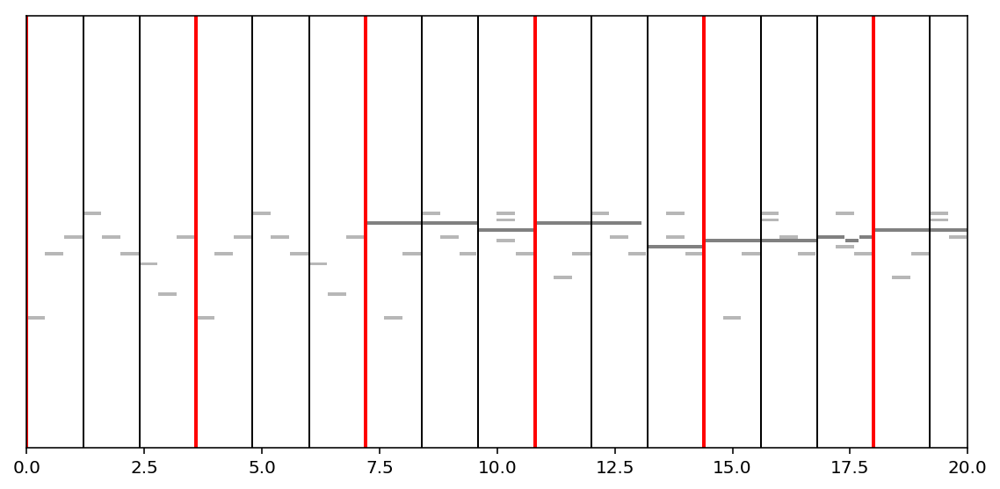

In [44]:
visualize_from_df(200,dfc,[0,20])